# Homework 2

**Name:** -- Diana Zepeda Tatengo --

**e-mail:** -- diana.zepeda6085@alumnos.udg.mx --

# MODULES

In [1]:
# Load modules
import numpy as np
import matplotlib.pyplot as plt
import math

from scipy.stats import wrapcauchy
from scipy.stats import levy_stable
from scipy.stats import exponweib

import plotly.graph_objects as go

# CLASSES

In [3]:
################# http://www.pygame.org/wiki/2DVectorClass ##################
class Vec2d(object):
    """2d vector class, supports vector and scalar operators,
       and also provides a bunch of high level functions
       """
    __slots__ = ['x', 'y']

    def __init__(self, x_or_pair, y = None):
        if y == None:            
            self.x = x_or_pair[0]
            self.y = x_or_pair[1]
        else:
            self.x = x_or_pair
            self.y = y
            
    # Addition
    def __add__(self, other):
        if isinstance(other, Vec2d):
            return Vec2d(self.x + other.x, self.y + other.y)
        elif hasattr(other, "__getitem__"):
            return Vec2d(self.x + other[0], self.y + other[1])
        else:
            return Vec2d(self.x + other, self.y + other)

    # Subtraction
    def __sub__(self, other):
        if isinstance(other, Vec2d):
            return Vec2d(self.x - other.x, self.y - other.y)
        elif (hasattr(other, "__getitem__")):
            return Vec2d(self.x - other[0], self.y - other[1])
        else:
            return Vec2d(self.x - other, self.y - other)
    
    # Vector length
    def get_length(self):
        return math.sqrt(self.x**2 + self.y**2)
    
    # rotate vector
    def rotated(self, angle):        
        cos = math.cos(angle)
        sin = math.sin(angle)
        x = self.x*cos - self.y*sin
        y = self.x*sin + self.y*cos
        return Vec2d(x, y)

# Theory of The Correlated Random Walk
...

# Theory of The Lévy distribution
...

# Activities
## 1. Correlated Random Walk - 1 Trajectory


In [9]:
# Initial Parameters
n_steps = 10000
s_pos = 0
speed = 3
CRW_exponent = 0.7

# Init velocity vector
velocity = Vec2d(speed,0)

# Brownian Walker in 2d
CRW_2d = np.ones(shape=(n_steps,2))*s_pos

for i in range(1,n_steps):
    # Choose a random angle 
        # rvs gets random values from the distribution
    #turn_angle = wrapcauchy.rvs(CRW_exponent) 
    turn_angle = wrapcauchy.rvs(CRW_exponent) * 2 * np.pi  # Convert to radians

    velocity = velocity.rotated(turn_angle)

    # Displace the particle
    CRW_2d[i,0] = CRW_2d[i-1,0] + velocity.x
    CRW_2d[i,1] = CRW_2d[i-1,1] + velocity.y

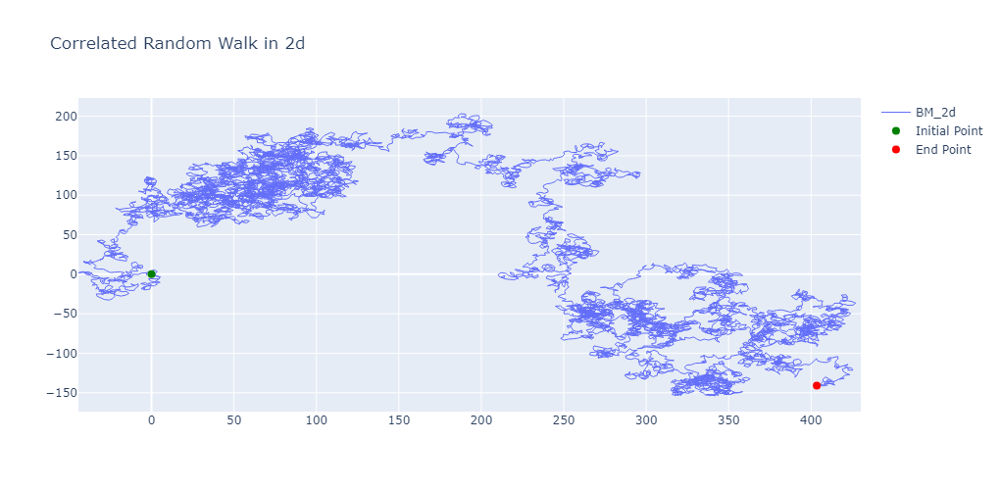

In [11]:
# Plot results
fig_CRW_2d = go.Figure()

fig_CRW_2d.add_trace(go.Scatter(x = CRW_2d[:,0],
                               y = CRW_2d[:,1],
                               marker = dict(size=2),
                               line = dict(width=1),
                               mode = 'lines',
                               name = 'BM_2d',
                               showlegend = True))

fig_CRW_2d.update_layout(width=800, height=500)

fig_CRW_2d.update_layout(title_text = 'Correlated Random Walk in 2d',
                        autosize = False    
)

# Initial Point
fig_CRW_2d.add_trace(go.Scatter(
    x=[CRW_2d[0, 0]],
    y=[CRW_2d[0, 1]],
    mode='markers',
    marker=dict(size=8, color='green', symbol='circle'),
    name='Initial Point'
))

# End Point
fig_CRW_2d.add_trace(go.Scatter(
    x=[CRW_2d[-1, 0]],
    y=[CRW_2d[-1, 1]],
    mode='markers',
    marker=dict(size=8, color='red', symbol='circle'),
    name='End Point'
))

fig_CRW_2d.show()

## 2. Lévy distribution - N different curves

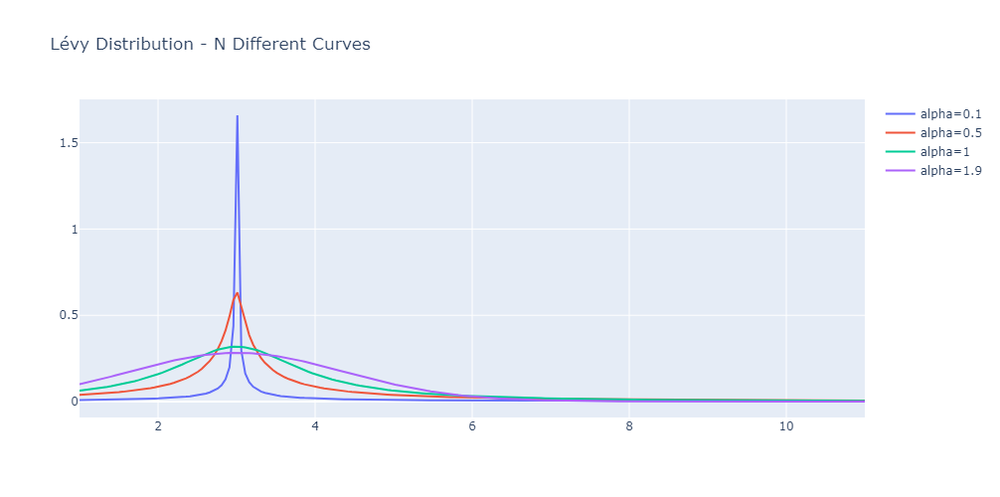

In [247]:
# Initial Parameters
m = 3
beta = 0
alphas = [0.1, 0.5, 1, 1.9] # Diferent values for alpha
resolution = 200
x = np.linspace(-2, 8, resolution)

fig_levy_pdf = go.Figure()

# Adding all the curves
for alpha in alphas:
    y = levy_stable.pdf(x, alpha, beta)
    fig_levy_pdf.add_trace(go.Scatter(x=x+m, y=y, mode='lines', name=f'alpha={alpha}'))

fig_levy_pdf.update_layout(
    title="Lévy Distribution - N Different Curves",
    width=800, 
    height=500
)

fig_levy_pdf.show()

## 3. Lévy distribution - Histogram + Curve

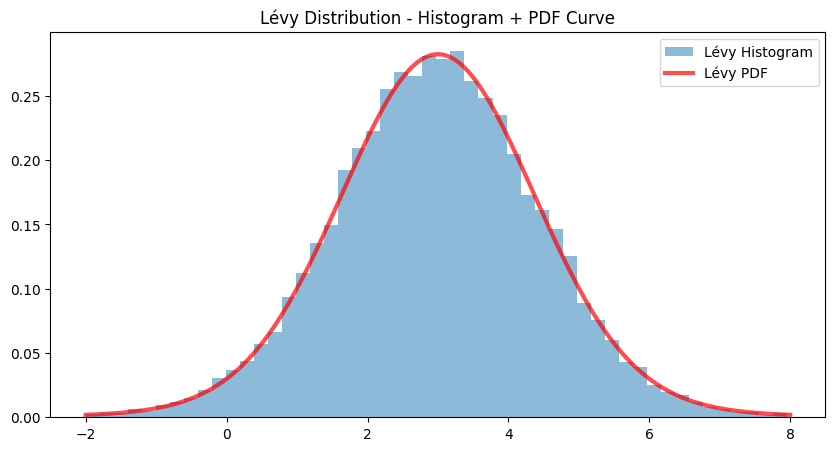

In [363]:
# Initial Parameters
alpha = 1.9
beta = 0
m = 3
resolution = 200
size = 20000
x = np.linspace(-2,8, resolution)

# Calculate the PDF of the Lévy distribution
levy_pdf = levy_stable.pdf(x, alpha, beta,loc=m)

# Generate a random sample from the Lévy distribution
r = levy_stable.rvs(alpha,beta,size=size,loc=m)
# Filter the sample
r = r[(r >= -2) & (r <= 8)]

fig, ax = plt.subplots(1,1)
fig.set_figheight(5)
fig.set_figwidth(10)

# Plot the histogram
ax.hist(r, bins=50, density=True, histtype='stepfilled', alpha=0.5, label='Lévy Histogram')

# Plot the curve 
ax.plot(x, levy_pdf, 'r-', lw = 3, alpha=0.7, label='Lévy PDF')

ax.set_title("Lévy Distribution - Histogram + PDF Curve")
ax.legend(loc='best')

plt.show()

## 4. Lévy flight - Vec2d - 1 Trajectory

In [ ]:
# Implementation

## 5. Correlated Random Walk - Vec2d - N Trajectories - 3D projection

In [ ]:
# Implementation